In [1]:
import pickle
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import re
import matplotlib.pyplot as plt
import umap
import umap.plot
import numpy as np
import matplotlib
import matplotlib.cm as cm  
import pandas as pd
import plotly
from math import log10

In [2]:
umap.plot.output_notebook() # So umap plots are rendered in notebook instead of a new tab

Loading BokehJS ...

### Define Shared Functions

In [3]:
def umap_plot_similar_words(title, labels, embedding_clusters, word_clusters, a, filename=None):
    umap_model_en_2d = umap.UMAP(random_state=42)

    embedding_clusters = np.array(embedding_clusters)
    n, m, k = embedding_clusters.shape
    embeddings_en_2d = np.array(umap_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)
    
    # Code modified from https://hedges.belmont.edu/scottergories/jupyter/2020/05/31/Visualizing-Word2Vec-Word-Embeddings-Using-tSNE.html
    figsize = (9.5,6) if (matplotlib.get_backend() == 'nbAgg') else (20,12)  # interactive plot should be smaller
    plt.figure(figsize=(figsize))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embeddings_en_2d, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=[color], alpha=a, label=label)
        for i, word in enumerate(words):
            plt.annotate(word, alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=8)
    plt.legend(loc=4)
    plt.title(title)
    plt.grid(True)
    plt.show()

In [4]:
def get_word2vec_clusters(keys, model):
    embedding_clusters = []
    word_clusters = []
    for word in keys:
        # print(f"Key = {word}")
        embeddings = []
        words = []
        for similar_word, _ in model.wv.most_similar(word, topn=10):
            # print(f"\t{similar_word}")
            words.append(similar_word)
            embeddings.append(model.wv[similar_word])
        embedding_clusters.append(embeddings)
        word_clusters.append(words)
    return embedding_clusters, word_clusters

## NetworkX + EliOrc

Embeddings from EliOrc Node2Vec implementation ([here](https://github.com/eliorc/node2vec)) which uses NetworkX graph

### Walk Length=80 && Num Walks=10

#### P=0.5 && Q=1.0

In [5]:
model__wl80__nw10__p0_5__q1_0 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p0.5_q1_nwalk10_wlen80_dims128_weighted_seeded_12-13_07:24.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


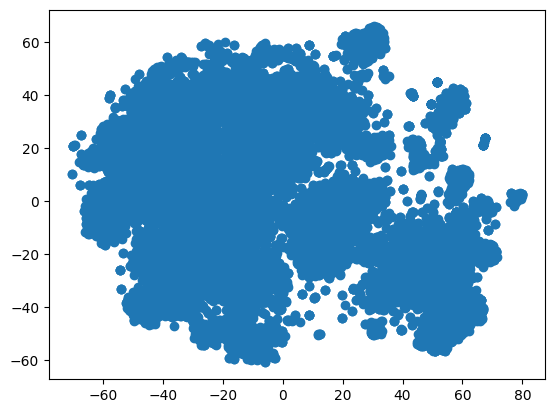

In [6]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl80__nw10__p0_5__q1_0.wv[model__wl80__nw10__p0_5__q1_0.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [7]:
X = model__wl80__nw10__p0_5__q1_0.wv[model__wl80__nw10__p0_5__q1_0.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [8]:
hover_data = pd.DataFrame.from_dict(model__wl80__nw10__p0_5__q1_0.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [9]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [10]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

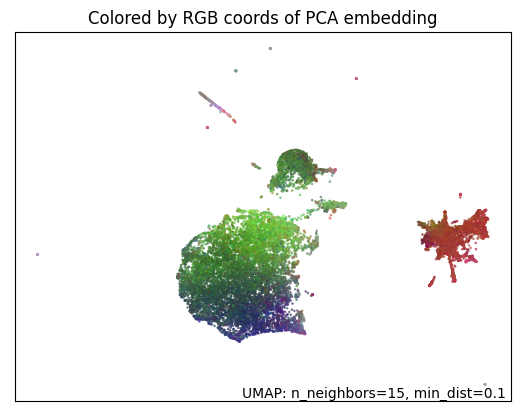

In [11]:
# What we are looking for here is a generally smooth transition of colors, and an overall layout that broadly respects the color transitions.
# https://umap-learn.readthedocs.io/en/latest/plotting.html#diagnostic-plotting
umap.plot.diagnostic(mapper, diagnostic_type='pca')

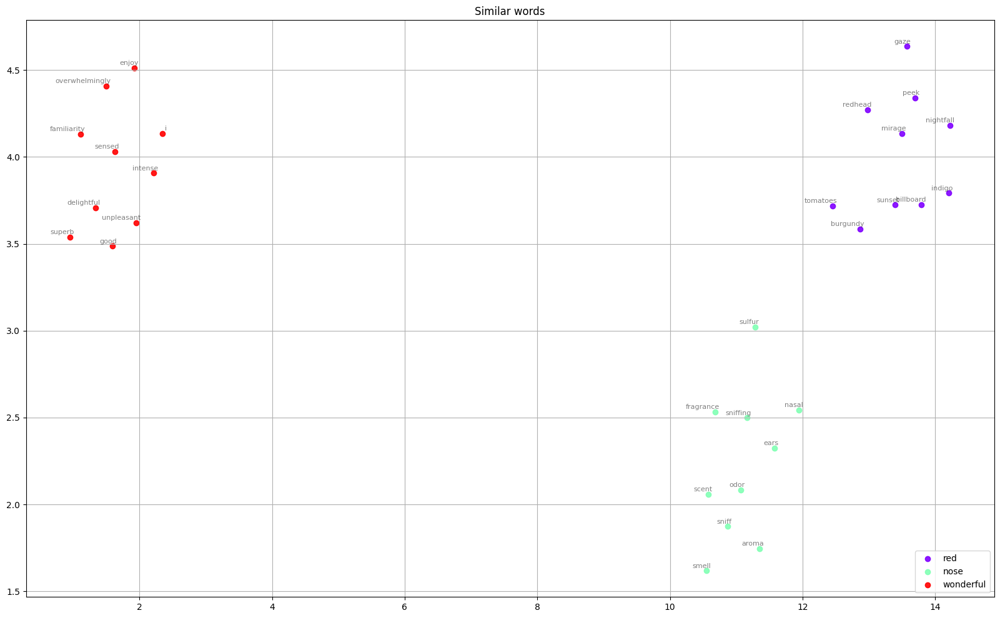

In [12]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl80__nw10__p0_5__q1_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl80__nw10__p0_5__q1_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

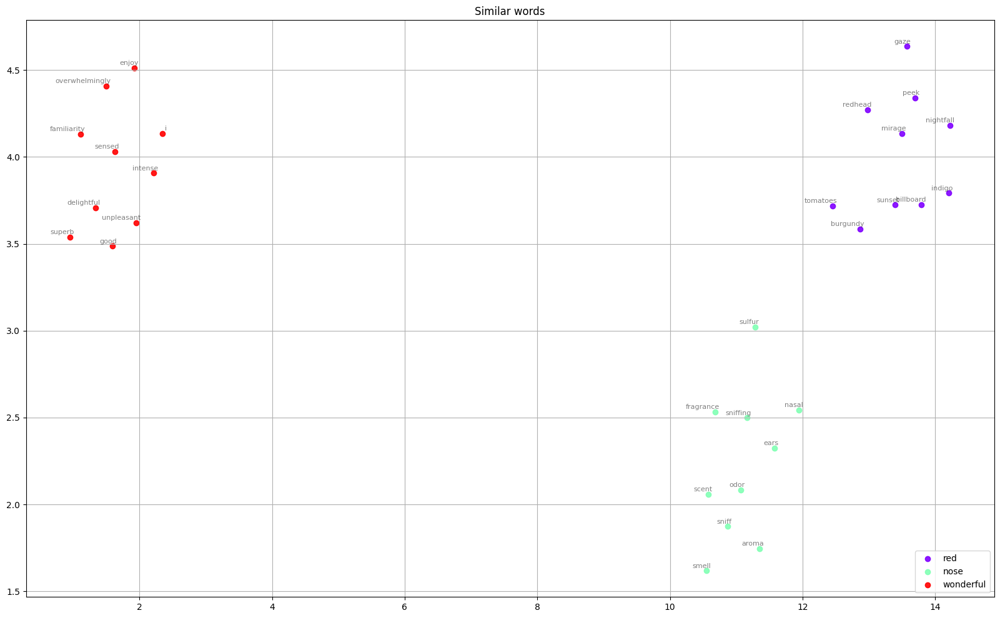

In [13]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl80__nw10__p0_5__q1_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl80__nw10__p0_5__q1_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

#### P=0.5 && Q=2.0

In [14]:
model__wl80__nw10__p0_5__q2_0 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p0.5_q2_nwalk10_wlen80_dims128_weighted_seeded_12-13_19:45.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


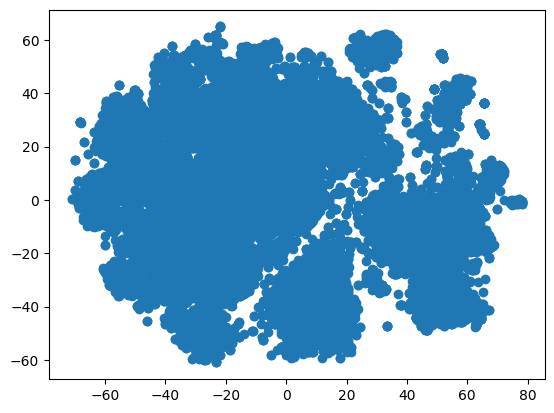

In [15]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl80__nw10__p0_5__q2_0.wv[model__wl80__nw10__p0_5__q2_0.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [16]:
X = model__wl80__nw10__p0_5__q2_0.wv[model__wl80__nw10__p0_5__q2_0.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [17]:
hover_data = pd.DataFrame.from_dict(model__wl80__nw10__p0_5__q2_0.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [18]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [19]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

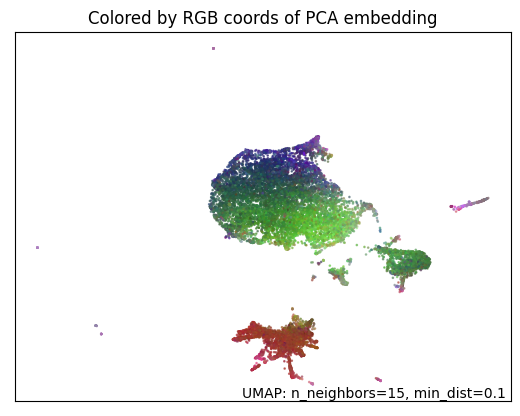

In [20]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

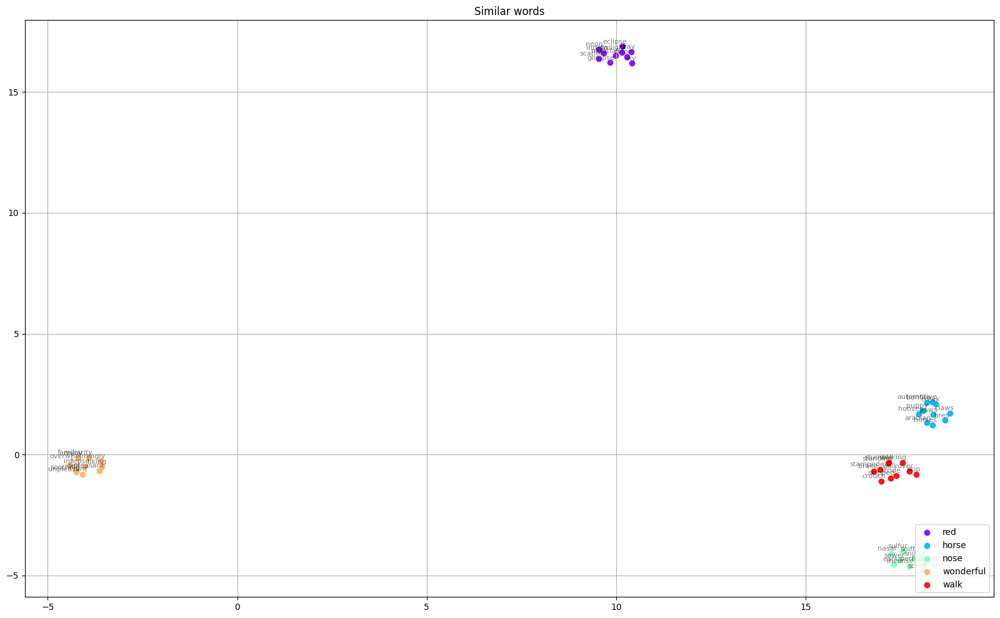

In [21]:
keys = ["red", "horse", "nose", "wonderful", "walk"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl80__nw10__p0_5__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

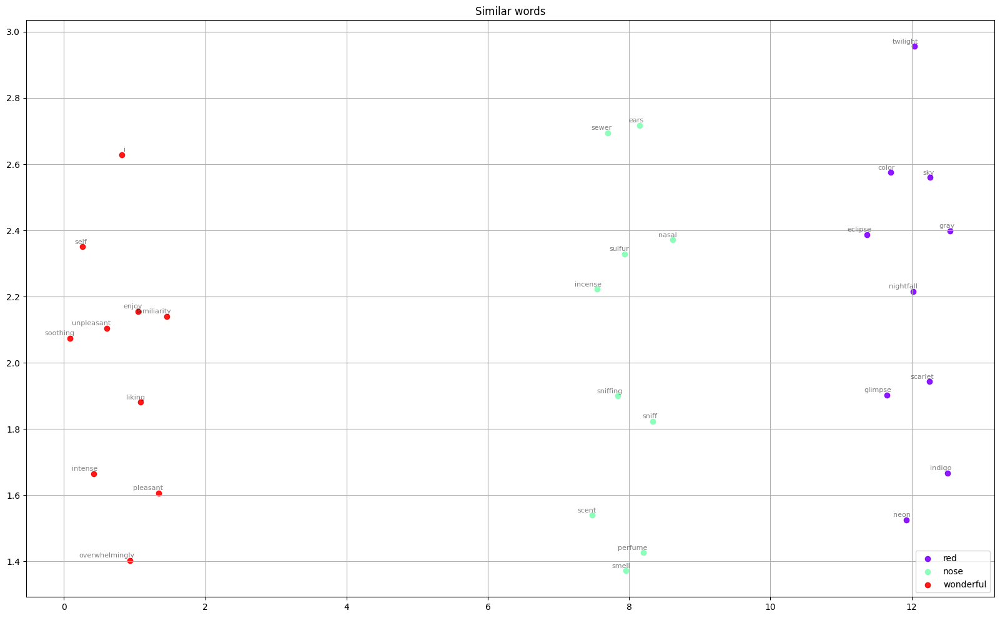

In [22]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl80__nw10__p0_5__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

### Walk Length=20 && Num Walks=10

#### P=0.5 && Q=1.0 

In [23]:
model__wl20__nw10__p0_5__q1_0 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p0.5_q1.0_nwalk10_wlen20_dims128_weighted_seeded_12-14_09:50.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


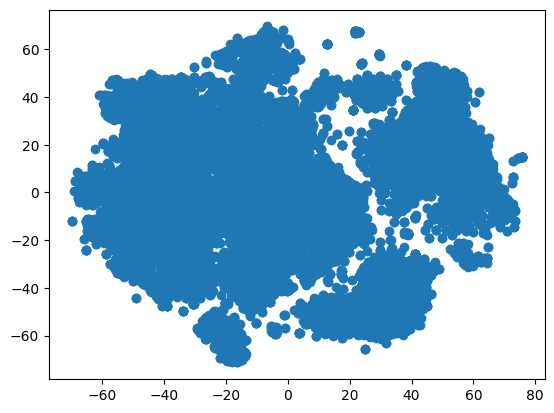

In [24]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl20__nw10__p0_5__q1_0.wv[model__wl20__nw10__p0_5__q1_0.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [25]:
X = model__wl20__nw10__p0_5__q1_0.wv[model__wl20__nw10__p0_5__q1_0.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [26]:
hover_data = pd.DataFrame.from_dict(model__wl20__nw10__p0_5__q1_0.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [27]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [28]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

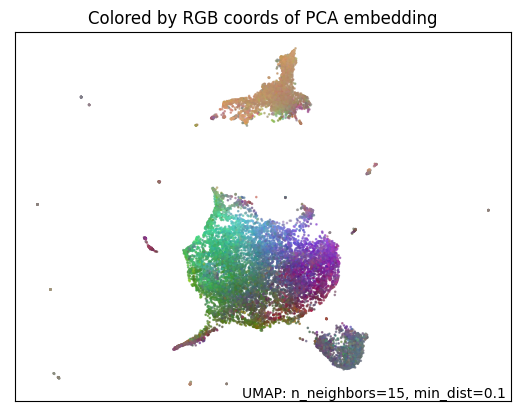

In [29]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

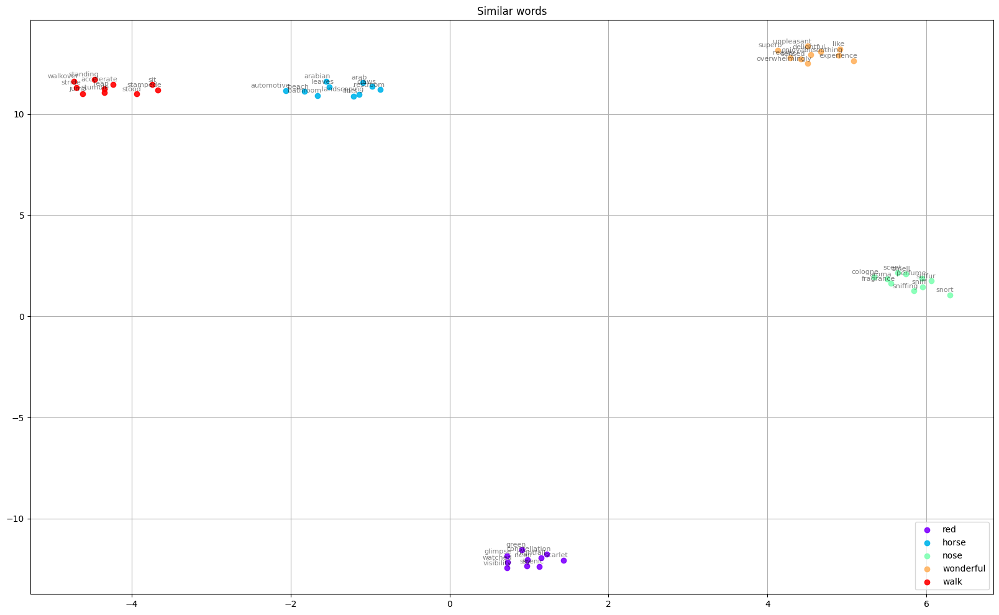

In [30]:
keys = ["red", "horse", "nose", "wonderful", "walk"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p0_5__q1_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

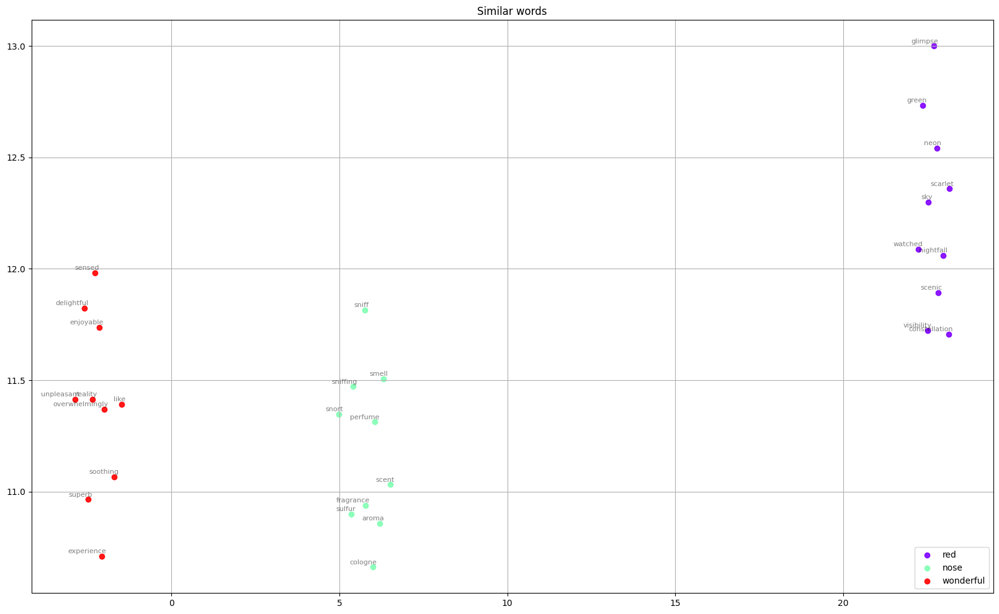

In [31]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p0_5__q1_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

#### P=0.5 && Q=2.0 

In [32]:
model__wl20__nw10__p0_5__q2_0 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p0.5_q2_nwalk10_wlen20_dims128_weighted_seeded_12-13_23:57.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


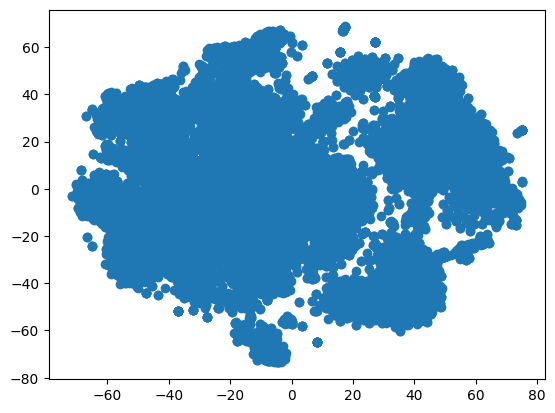

In [33]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl20__nw10__p0_5__q2_0.wv[model__wl20__nw10__p0_5__q2_0.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [34]:
X = model__wl20__nw10__p0_5__q2_0.wv[model__wl20__nw10__p0_5__q2_0.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [35]:
hover_data = pd.DataFrame.from_dict(model__wl20__nw10__p0_5__q2_0.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [36]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [37]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

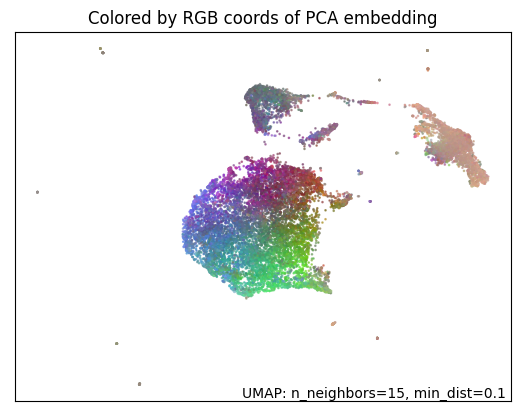

In [38]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

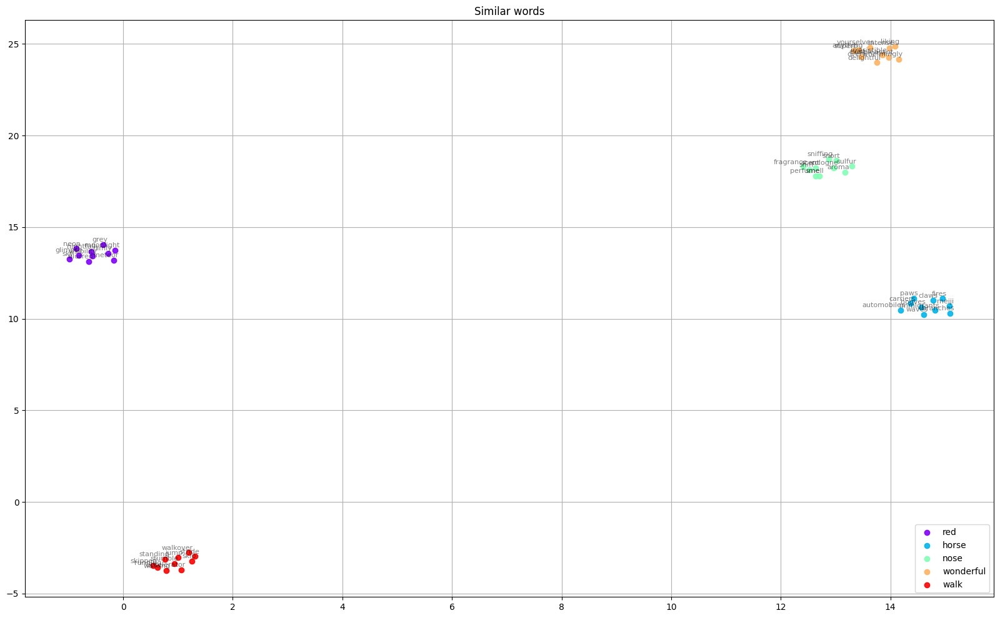

In [39]:
keys = ["red", "horse", "nose", "wonderful", "walk"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p0_5__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

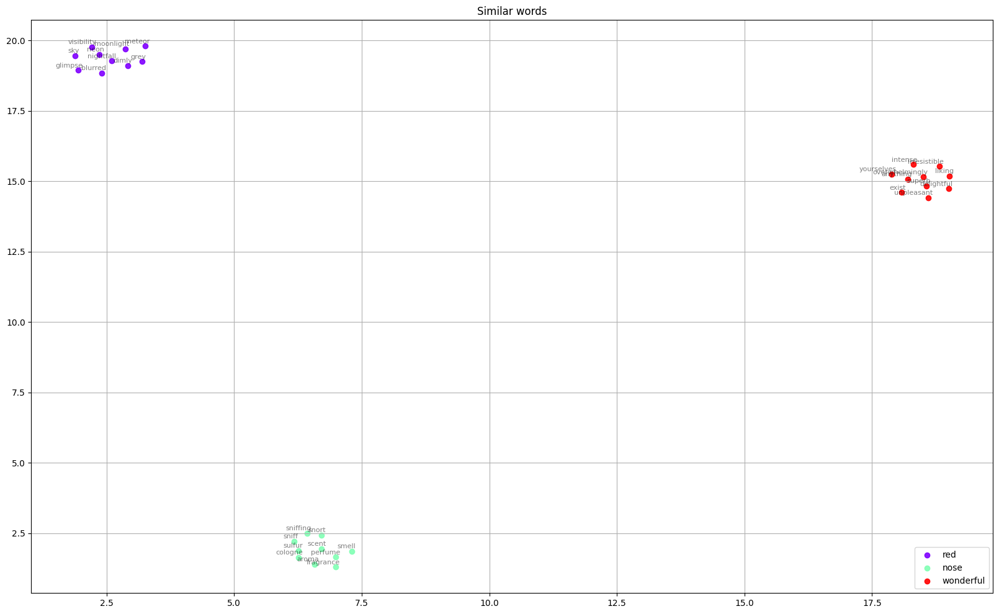

In [40]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl80__nw10__p0_5__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p0_5__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

#### P=1.0 && Q=2.0 ⭐️

This is the embedding I used in my project report.

In [41]:
model__wl20__nw10__p1_0__q2_0 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p1_q2_nwalk10_wlen20_dims128_weighted_seeded_12-14_03:39.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


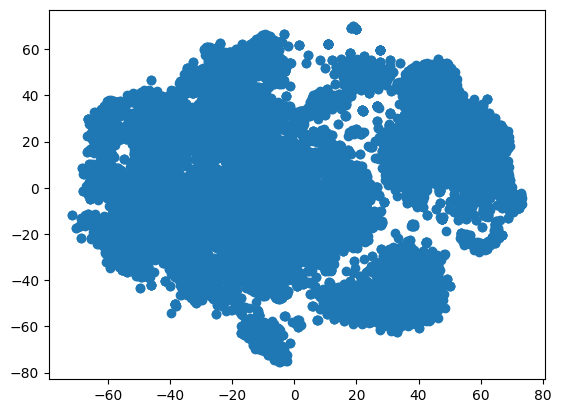

In [42]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl20__nw10__p1_0__q2_0.wv[model__wl20__nw10__p1_0__q2_0.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [43]:
X = model__wl20__nw10__p1_0__q2_0.wv[model__wl20__nw10__p1_0__q2_0.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [44]:
hover_data = pd.DataFrame.from_dict(model__wl20__nw10__p1_0__q2_0.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [45]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [46]:
p.title.text = "Node Embeddings"
p.title.align = "center"
p.title.text_font_size = "25px"

In [47]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

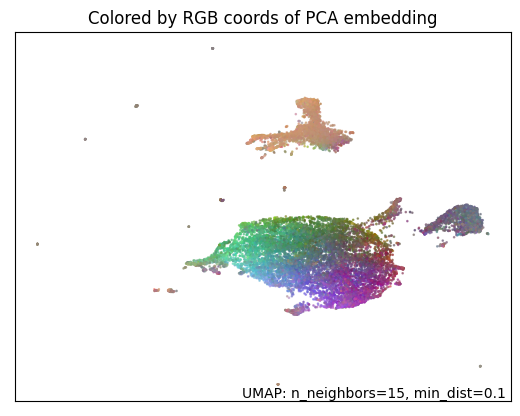

In [48]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

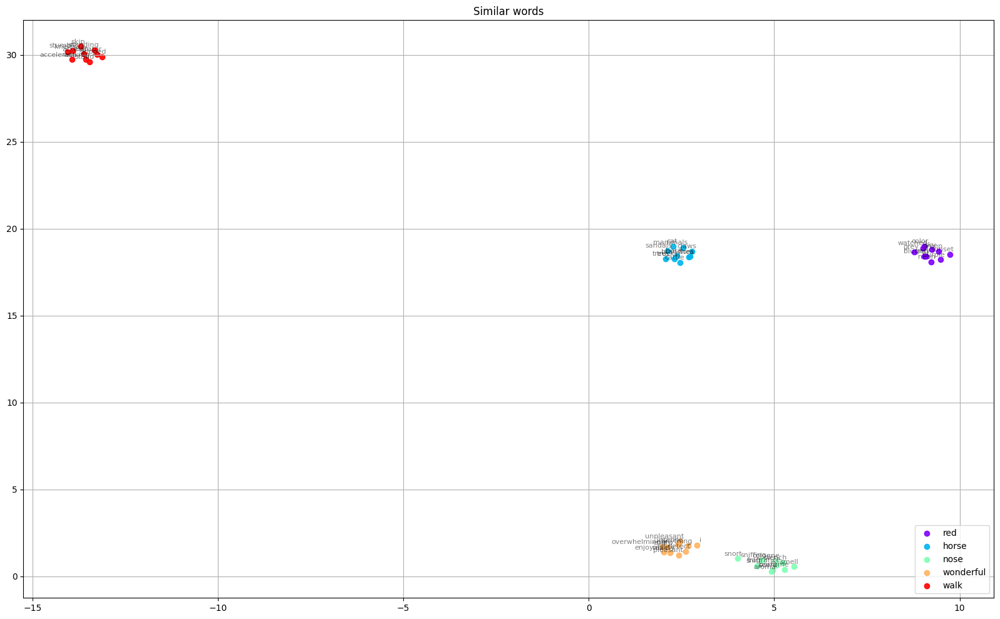

In [49]:
keys = ["red", "horse", "nose", "wonderful", "walk"]
# keys = list(model__wl20__nw10__p1_0__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p1_0__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

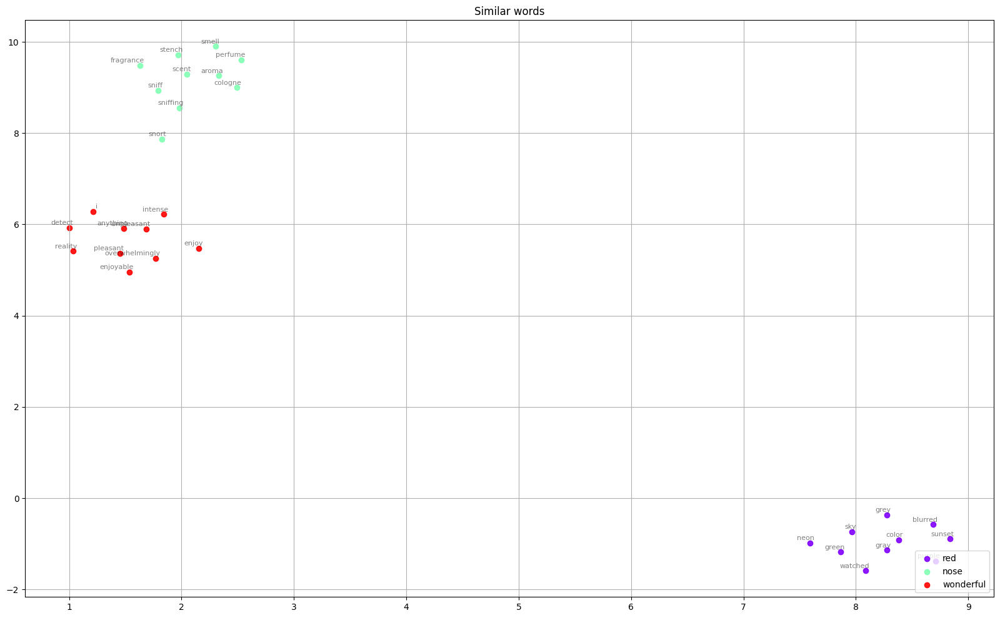

In [50]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl20__nw10__p1_0__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p1_0__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


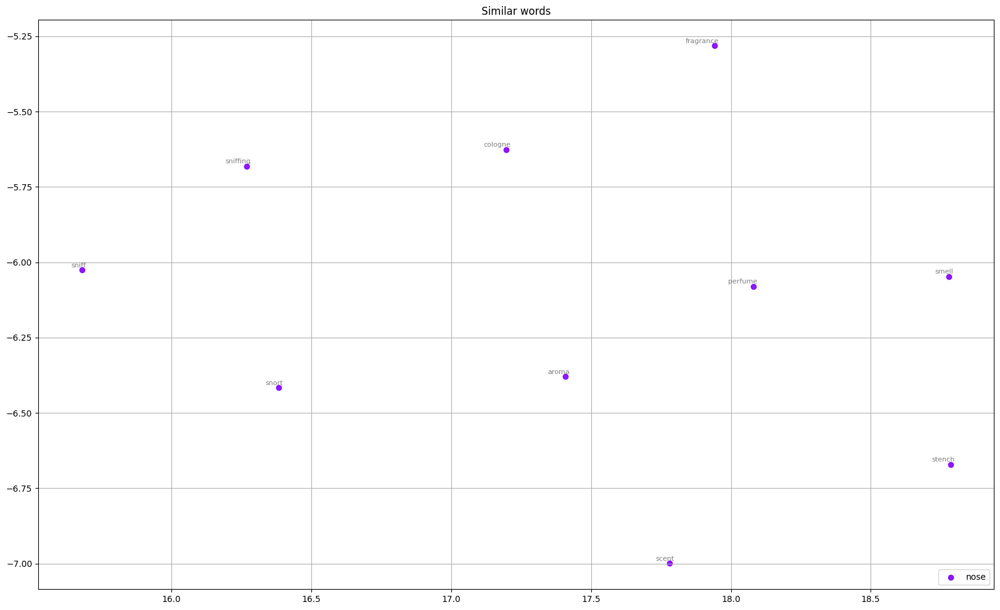

In [51]:
keys = ["nose"]
# keys = list(model__wl20__nw10__p1_0__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p1_0__q2_0)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

#### P=2.0 && Q=0.5

In [52]:
model__wl20__nw10__p2_0__q0_5 = Word2Vec.load("networkx_embeddings/model_bert_vocab_90_p2_q0.5_nwalk10_wlen20_dims128_weighted_seeded_12-14_07:24.model")

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


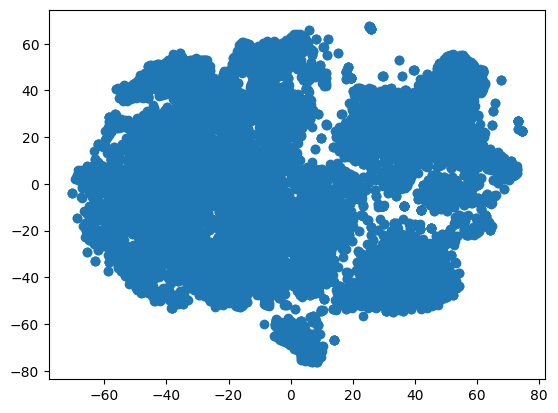

In [53]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(model__wl20__nw10__p2_0__q0_5.wv[model__wl20__nw10__p2_0__q0_5.wv.key_to_index])

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [54]:
X = model__wl20__nw10__p2_0__q0_5.wv[model__wl20__nw10__p2_0__q0_5.wv.key_to_index]
mapper = umap.UMAP(random_state=42).fit(X)

In [55]:
hover_data = pd.DataFrame.from_dict(model__wl20__nw10__p2_0__q0_5.wv.key_to_index, orient='index')
hover_data = hover_data.reset_index().rename(columns={'index': 'label', 0:'index'})

In [56]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [57]:
p.title.text = "Node Embeddings"
p.title.align = "center"
p.title.text_font_size = "25px"

In [58]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

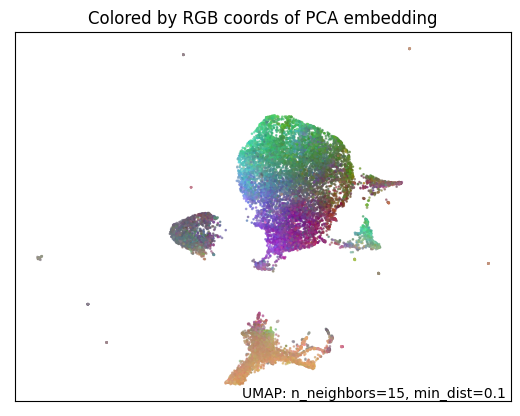

In [59]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

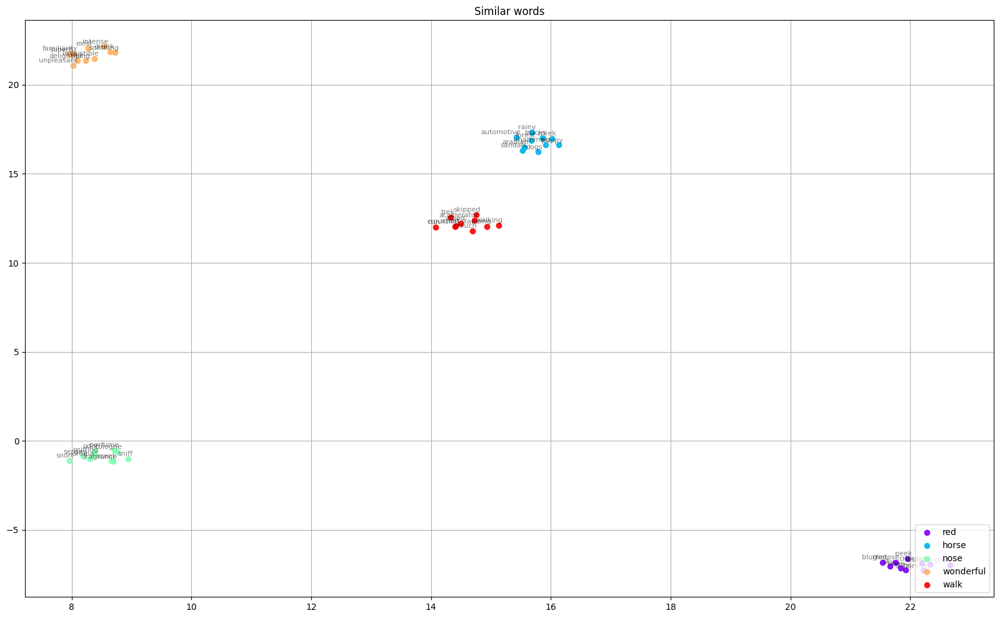

In [60]:
keys = ["red", "horse", "nose", "wonderful", "walk"]
# keys = list(model__wl20__nw10__p1_0__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p2_0__q0_5)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

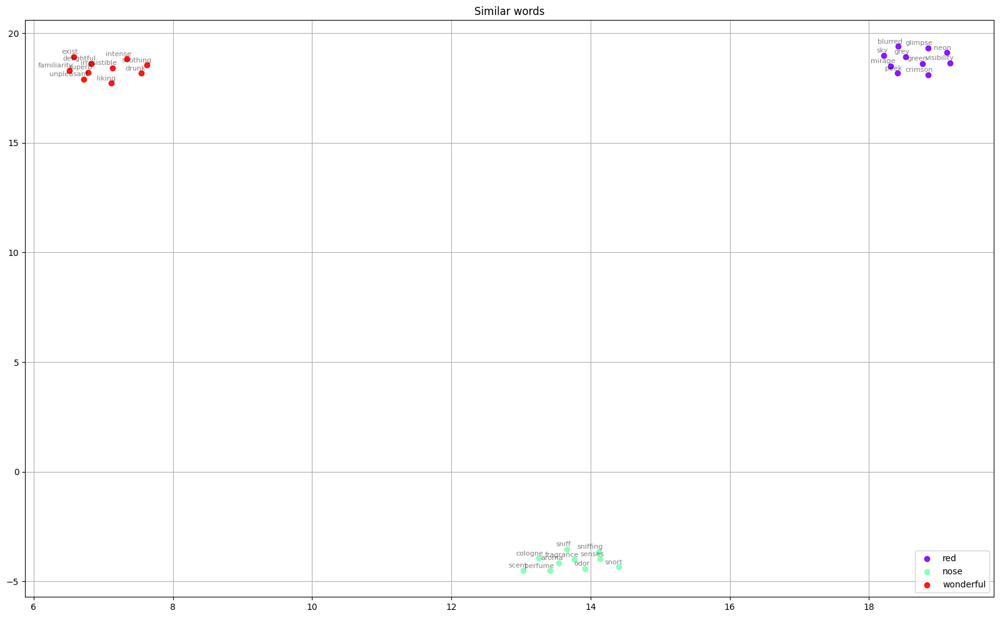

In [61]:
keys = ["red", "nose", "wonderful"]
# keys = list(model__wl20__nw10__p1_0__q2_0.wv.key_to_index.keys())[:4]
embedding_clusters, word_clusters = get_word2vec_clusters(keys, model__wl20__nw10__p2_0__q0_5)
umap_plot_similar_words('Similar words', keys, embedding_clusters, word_clusters, 0.9,
                        'similar_words.png')

## NetworKit

Embeddings from NetworKit Node2Vec implementation ([here](https://networkit.github.io/dev-docs/cpp_api/classNetworKit_1_1Node2Vec.html)) which uses NetworkKit graph

In [62]:
with open(r"generated_layer_data/free_assoc_visual_list_lancaster_list_bert_word_emb_list_index_to_word_BERT_intersect.pickle", "rb") as input_file:
    index_to_word = pickle.load(input_file)

### Walk Length=80 && Num Walks=10

#### P=0.5 && Q=1.0

In [63]:
with open(r"networkit_embeddings/vectors_full_90_p0.5_q1_nwalk10_wlen80_dims128_weighted_12-13_04:48.pickle", "rb") as input_file:
    vectors__wl80__nw10__p0_5__q1_0 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


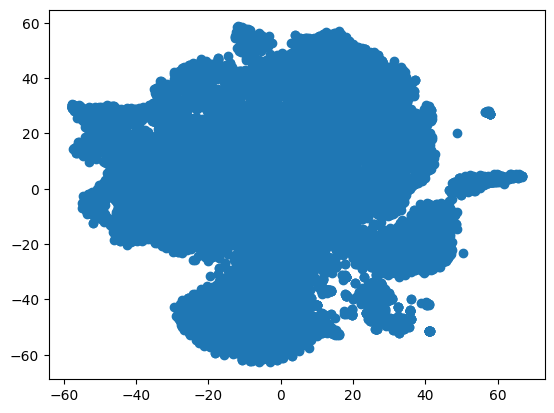

In [64]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl80__nw10__p0_5__q1_0))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [65]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl80__nw10__p0_5__q1_0))

In [66]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [67]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [68]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

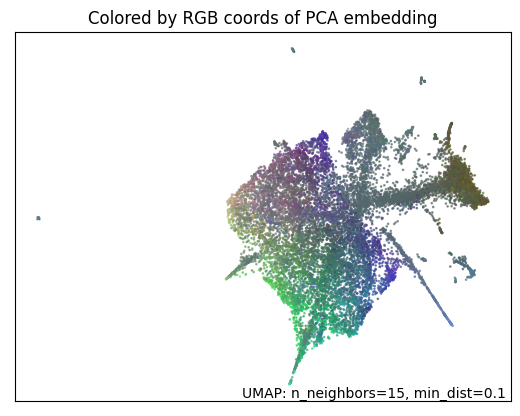

In [69]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

#### P=0.5 && Q=2.0

In [70]:
with open(r"networkit_embeddings/vectors_full_90_p0.5_q2_nwalk10_wlen80_dims128_weighted_12-13_05:04.pickle", "rb") as input_file:
    vectors__wl80__nw10__p0_5__q2_0 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


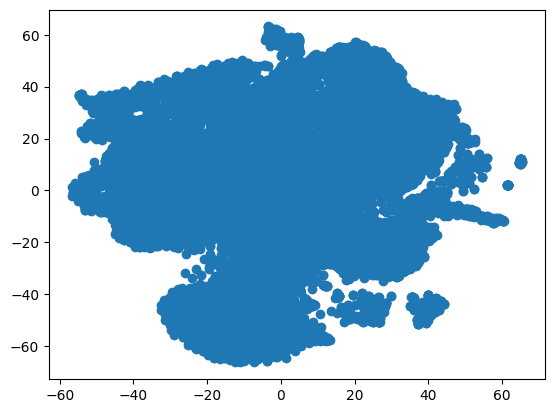

In [71]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl80__nw10__p0_5__q2_0))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [72]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl80__nw10__p0_5__q2_0))

In [73]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [74]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [75]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

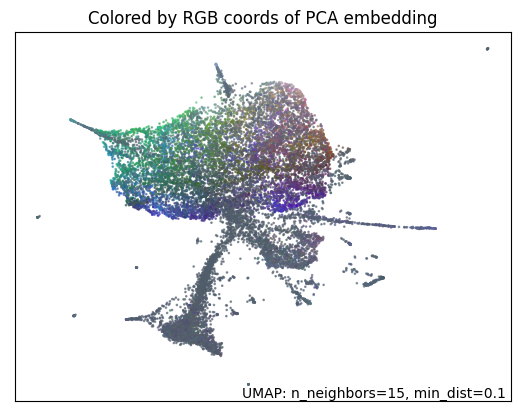

In [76]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

### Walk Length=20 && Num Walks=10

#### P=0.5 && Q=1.0

In [77]:
with open(r"networkit_embeddings/vectors_full_90_p0.5_q1.0_nwalk10_wlen20_dims128_weighted_12-14_18:23.pickle", "rb") as input_file:
    vectors__wl20__nw10__p0_5__q1_0 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


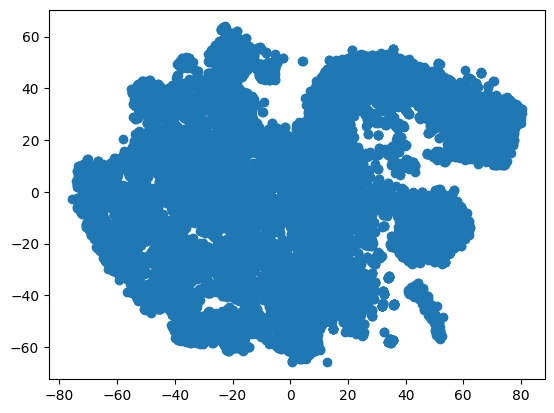

In [78]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl20__nw10__p0_5__q1_0))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [79]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl20__nw10__p0_5__q1_0))

In [80]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [81]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [82]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

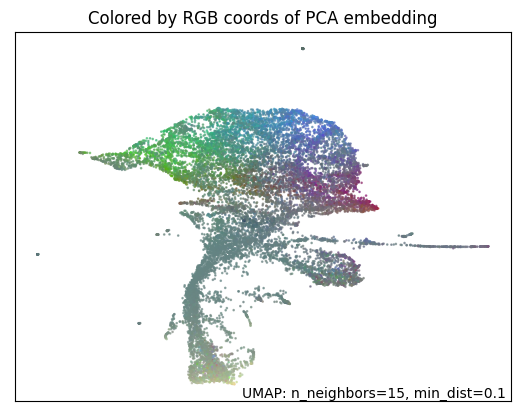

In [83]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

#### P=0.5 && Q=2.0

In [84]:
with open(r"networkit_embeddings/vectors_full_90_p0.5_q2_nwalk10_wlen20_dims128_weighted_12-13_21:39.pickle", "rb") as input_file:
    vectors__wl20__nw10__p0_5__q2_0 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


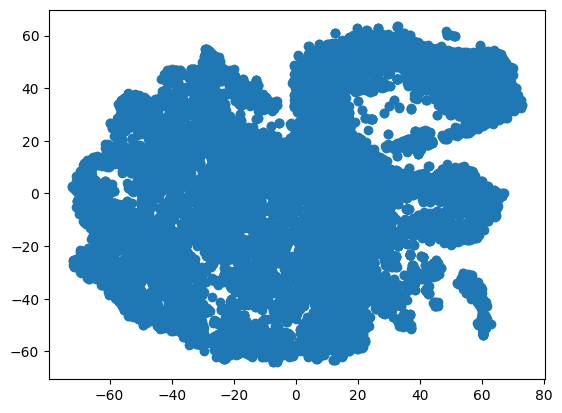

In [85]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl20__nw10__p0_5__q2_0))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [86]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl20__nw10__p0_5__q2_0))

In [87]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [88]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [89]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

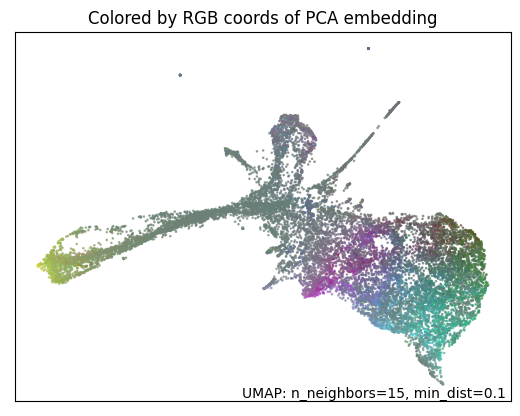

In [90]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

#### P=1.0 && Q=2.0

In [91]:
with open(r"networkit_embeddings/vectors_full_90_p1_q2_nwalk10_wlen20_dims128_weighted_12-13_22:13.pickle", "rb") as input_file:
    vectors__wl20__nw10__p1_0__q2_0 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


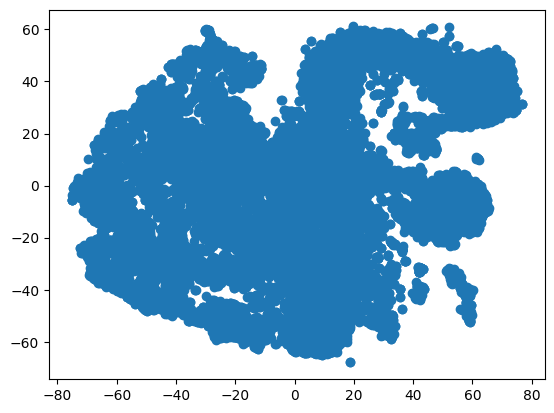

In [92]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl20__nw10__p1_0__q2_0))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [93]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl20__nw10__p1_0__q2_0))

In [94]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [95]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [96]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

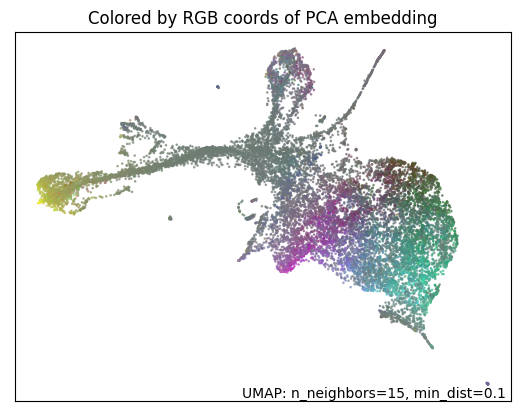

In [97]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')

#### P=2.0 && Q=0.5

In [98]:
with open(r"networkit_embeddings/vectors_full_90_p2_q0.5_nwalk10_wlen20_dims128_weighted_12-14_05:28.pickle", "rb") as input_file:
    vectors__wl20__nw10__p2_0__q0_5 = pickle.load(input_file)

##### TSNE

/Users/catherinehenry/Library/Caches/pypoetry/virtualenvs/cs596-final-proj-M-BMq5HJ-py3.8/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


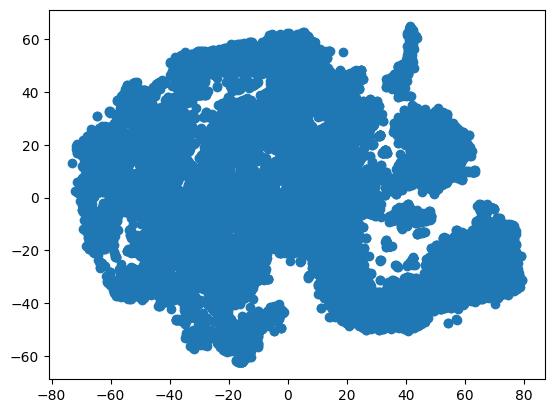

In [99]:
tsne = TSNE(random_state=42, n_components=2, learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(np.array(vectors__wl20__nw10__p2_0__q0_5))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.show()

##### UMAP

In [100]:
mapper = umap.UMAP(random_state=42).fit(np.array(vectors__wl20__nw10__p2_0__q0_5))

In [101]:
hover_data = pd.DataFrame.from_dict(index_to_word, orient='index')
hover_data = hover_data.reset_index().rename(columns={0: "item"})

In [102]:
p = umap.plot.interactive(mapper, hover_data=hover_data, point_size=2)

In [103]:
umap.plot.show(p)

<AxesSubplot: title={'center': 'Colored by RGB coords of PCA embedding'}>

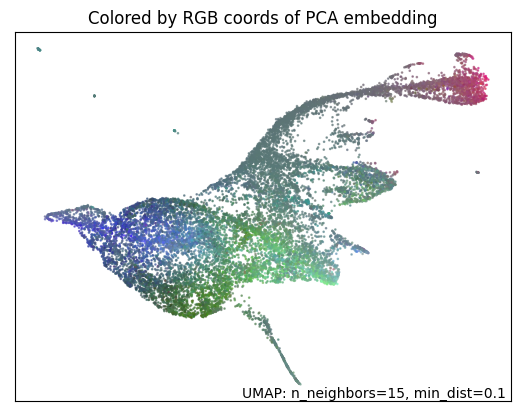

In [104]:
umap.plot.diagnostic(mapper, diagnostic_type='pca')